# Metric experiments

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import glob
import cv2

import utils

In [2]:
import numpy as np
print(np.__version__)

2.1.2


In [49]:
import pickle
import json

# Load the pickle file
with open("pixels.pkl", "rb") as f:
    data = pickle.load(f)

# Save to JSON (if data is serializable)
with open("pixels.json", "w") as f:
    json.dump(data, f)

TypeError: Object of type ndarray is not JSON serializable

In [48]:
pixel_list

{'LT05_L2SP_208024_20110323_20200823_02_T1': {'water': [array([158, 226]),
   array([187, 250]),
   array([242, 140]),
   array([239, 139]),
   array([221, 147]),
   array([ 94, 162]),
   array([172, 146]),
   array([204,  31]),
   array([140, 184]),
   array([241, 212])],
  'land': [array([22, 46]),
   array([  3, 130]),
   array([103,  58]),
   array([126, 149]),
   array([ 9, 15]),
   array([ 32, 187]),
   array([134,  11]),
   array([115,  55]),
   array([101, 239]),
   array([ 94, 215])],
  'coastline': [array([106, 134]),
   array([104, 117]),
   array([142,  91]),
   array([145, 129]),
   array([ 57, 164]),
   array([126, 161]),
   array([ 79, 196]),
   array([ 81, 197]),
   array([163,   7]),
   array([148,  52])],
  'fp': [array([135, 170]),
   array([ 98, 111]),
   array([147, 101]),
   array([ 53, 148]),
   array([ 88, 197]),
   array([118, 224]),
   array([ 96, 110]),
   array([ 94, 110]),
   array([135, 171]),
   array([139, 171])],
  'fn': [array([ 52, 127]),
   array([ 7

In [47]:
import pickle

pixel_list = pickle.load(open('pixels.pkl', 'rb'))

for name in pixel_list.keys():
    water = len(pixel_list[name]['water'])
    land = len(pixel_list[name]['land'])
    coastline = len(pixel_list[name]['coastline'])
    fp = len(pixel_list[name]['fp'])
    fn = len(pixel_list[name]['fn'])

    print(f'{name}: water={water}, land={land}, coastline={coastline}, fp={fp}, fn={fn}')

LT05_L2SP_208024_20110323_20200823_02_T1: water=10, land=10, coastline=10, fp=10, fn=10
LT05_L2SP_207023_19890506_20200916_02_T1: water=10, land=10, coastline=10, fp=10, fn=10
LC08_L2SP_205024_20160331_20200907_02_T1: water=10, land=10, coastline=10, fp=10, fn=10
LT05_L2SP_205023_19950626_20200912_02_T1: water=10, land=10, coastline=10, fp=10, fn=10
LT05_L2SP_208024_20080922_20200829_02_T1: water=10, land=10, coastline=10, fp=10, fn=10
LC08_L2SP_205024_20150124_20200910_02_T1: water=10, land=10, coastline=10, fp=10, fn=10
LE07_L2SP_207023_20010224_20200917_02_T1: water=10, land=10, coastline=10, fp=10, fn=10
LT05_L2SP_207022_19890506_20200917_02_T1: water=10, land=10, coastline=10, fp=10, fn=10
LC08_L2SP_207023_20130403_20200913_02_T1: water=10, land=10, coastline=10, fp=10, fn=10
LC08_L2SP_206022_20180702_20200831_02_T1: water=10, land=10, coastline=10, fp=10, fn=10
LT05_L2SP_206022_19971028_20200910_02_T1: water=10, land=10, coastline=10, fp=10, fn=10
LT05_L2SP_207022_19950726_202111

In [4]:
# Load paths
test_paths = glob.glob('../../data/LICS/test/*')
print(len(test_paths))

map_paths = glob.glob('../maps_temp/*')
print(len(map_paths))

100
825


In [38]:
for path in map_paths:
    map_new = np.load(path)
    map_old = np.load(path.replace('maps_temp', 'maps'))

    check = np.abs(map_old - map_new) > 1e-5 
    if np.sum(check) > 0: 
        print(path)


(256, 256) (256, 256)
0


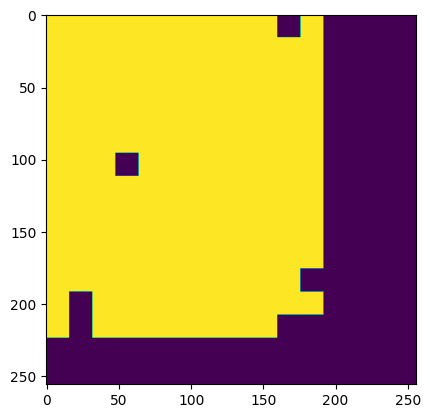

In [37]:
path = "../maps_temp/LT05_L2SP_205023_19950626_20200912_02_T1_pixel_coastline_92_60_32_16.npy"
map_new = np.load(path)
map_old = np.load(path.replace('maps_temp', 'maps'))

print(map_new.shape, map_old.shape)
print(np.sum(np.abs(map_old - map_new) > 1e-5))

plt.imshow(np.abs(map_old - map_new) > 1e-8 )

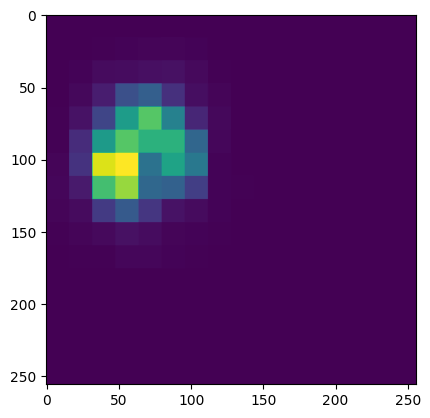

In [33]:
plt.imshow(map_new)

In [35]:
np.max(np.abs(map_old-map_new))

np.float64(1.0197288767069268e-06)

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

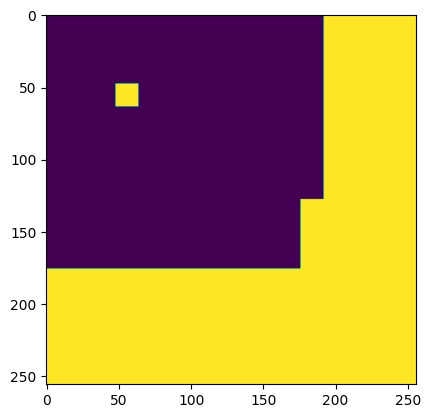

In [ ]:


# Check if the maps are the same
plt.imshow(map_old == map_new)

In [9]:
band_dic = {"sentinel":{"coastal":0,"blue":1,"green":2,"red":3,"rededge1":4,"rededge2":5,"rededge3":6,"nir":7,"narrownir":8,"watervapour":9,"swir1":10,"swir2":11},
         "landsat":{"blue":0,"green":1,"red":2,"nir":3,"swir1":4,"swir2":5,"thermal":6}}

def scale_bands(img,satellite="landsat"):
    """Scale bands to 0-1"""
    img = img.astype("float32")
    if satellite == "landsat":
        img = np.clip(img * 0.0000275 - 0.2, 0, 1)
    elif satellite == "sentinel":
        img = np.clip(img/10000, 0, 1)
    return img



In [6]:
def occlusion_visualisation(background, map, alpha=0.5, use_rgb=True):
    """Overlay the occlusion map on the background image.
    
    Args:
        background (np.array): The background image.
        map (np.array): The occlusion map.
        alpha (float): The transparency of the occlusion map.
        
    Returns:
        np.array: The visualization.
    """
    # Normalize the occlusion map to the range [0, 1]
    map = (map - np.min(map)) / (np.max(map) - np.min(map) + 1e-8)

     # Convert the occlusion map to a heatmap
    heatmap = cv2.applyColorMap((map * 255).astype(np.uint8), cv2.COLORMAP_JET)

    if use_rgb:
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    
    # Ensure the background is 3-channel (RGB)
    if len(background.shape) == 2 or background.shape[2] == 1:  # Grayscale or binary segmentation
        background = cv2.cvtColor(background, cv2.COLOR_GRAY2RGB)
    
    # Convert both background and heatmap to the same data type (uint8)
    if background.dtype != np.uint8:
        background = (255 * (background - np.min(background)) / (np.max(background) - np.min(background) + 1e-8)).astype(np.uint8)
    
    # Overlay the heatmap on the background
    overlay = cv2.addWeighted(heatmap, alpha, background, 1 - alpha, 0)
    
    return overlay

def plot_occlusion_map(img, overlay, pixel, colour=(255,0,0),length=5, weighted_context= None):

    # Add cross at pixel location
    img = img.copy()
    # add diagonal lines
    cv2.line(img, (pixel[1]-length, pixel[0]-length), (pixel[1]+length, pixel[0]+length), colour, 2)
    cv2.line(img, (pixel[1]+length, pixel[0]-length), (pixel[1]-length, pixel[0]+length), colour, 2)


    # Plotting the occlusion map
    fig,ax = plt.subplots(1,2,figsize=(10,5))
    ax[0].imshow(img)
    ax[0].set_title('Image')

    ax[1].imshow(overlay)
    if weighted_context is None:
        ax[1].set_title('Occlusion Map')
    else:
        ax[1].set_title(f'Occlusion Map ({weighted_context})')
    
    for a in ax:
        a.axis('off')

In [7]:
def calc_weighted_context(pixel,heatmap):

    """Calculate the weighted context of a pixel based on the occlusion map."""

    # Flatten the heatmap
    pixel_cords = np.indices(heatmap.shape).reshape(2, -1).T
    flat_heatmap = heatmap.flatten()
    flat_heatmap = np.array(flat_heatmap)

    # Compute the euclidian distance between the pixel and all other pixels
    pixel_cords = np.array(pixel_cords)
    pixel = np.array(pixel)
    x, y = pixel

    distances = np.sqrt((pixel_cords[:, 0] - x)**2 + (pixel_cords[:, 1] - y)**2)

    # Compute the weighted distance
    weighted_context = np.sum(distances * flat_heatmap)

    normalized_weighted_context = weighted_context / np.sum(distances)

    return weighted_context, normalized_weighted_context

(256, 256, 11)

(256, 256, 11)


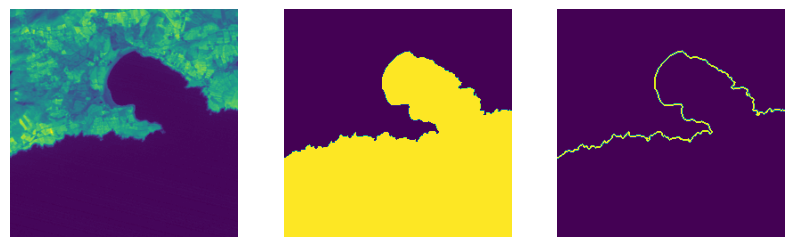

In [12]:
name = "LT05_L2SP_208024_20110323_20200823_02_T1"
path = f'../../data/LICS/test/{name}.npy'

# Load data
data = np.load(path)
print(data.shape)

nir = data[:,:,3]
#rgb = get_rgb(data,contrast=0.2)
mask = data[:,:,-2]
edge = data[:,:,-1]

fig, ax = plt.subplots(1, 3, figsize=(10, 5))
ax[0].imshow(nir)
ax[1].imshow(mask)
ax[2].imshow(edge)

for a in ax:
    a.axis('off')

In [13]:
name = "LT05_L2SP_208024_20110323_20200823_02_T1"
maps = [m for m in map_paths if name in m]

masks = [m for m in maps if 'mask' in m]

pixels = [m for m in maps if 'pixel' in m]

print(len(maps), len(masks), len(pixels))

55 5 50


(214, 33)
(np.float64(27939.59431013408), np.float64(0.002828532310286736))


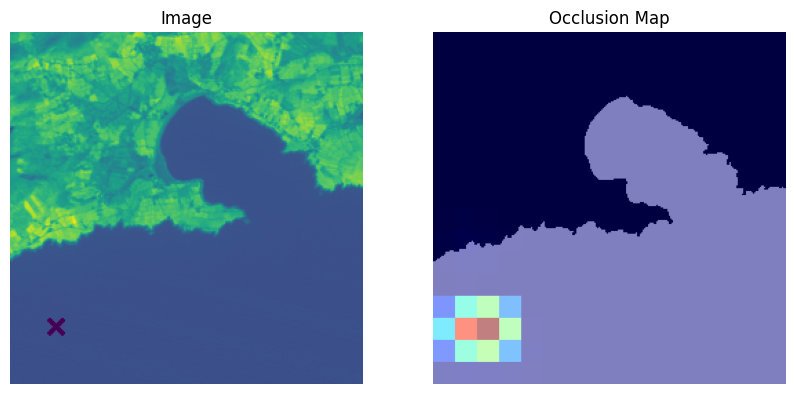

In [14]:
path = pixels[0]

x = path.split('_')[-4]
y = path.split('_')[-3]
pixel = (int(x), int(y))
print(pixel)

heatmap = np.load(path)
weighted_context = calc_weighted_context(pixel, heatmap)
print(weighted_context)

overlay = occlusion_visualisation(mask, heatmap, alpha=0.5)
plot_occlusion_map(nir, overlay,pixel)

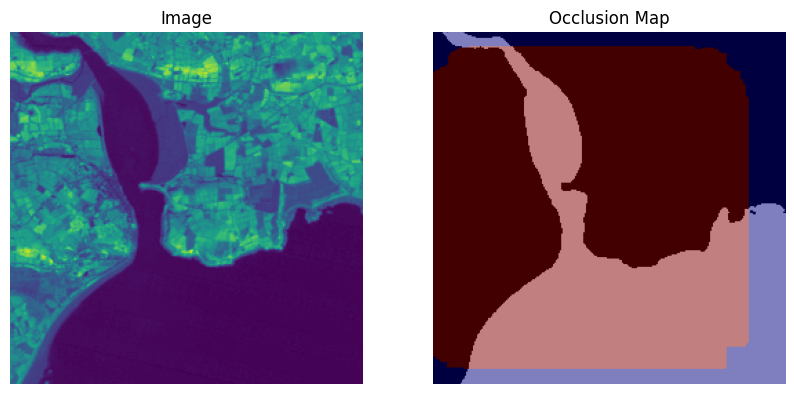

In [73]:
# make heatmap binary
binary_heatmap = np.zeros(heatmap.shape)
binary_heatmap[heatmap > 0] = 1

overlay = occlusion_visualisation(mask, binary_heatmap , alpha=0.5)
plot_occlusion_map(nir, overlay)

[[  0   0]
 [  0   1]
 [  0   2]
 ...
 [255 253]
 [255 254]
 [255 255]]
[0. 0. 0. ... 0. 0. 0.]
128 111
[169.42549985 168.7720356  168.12197953 ... 190.50721771 191.25375813
 192.00260415]


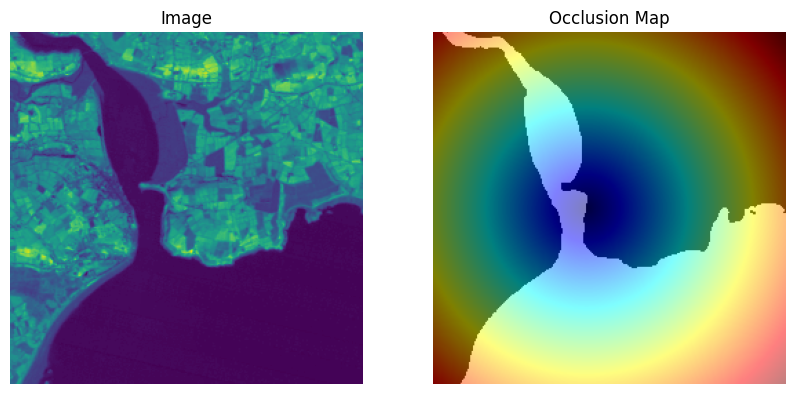

In [82]:
# Flatten the heatmap
pixel_cords = np.indices(heatmap.shape).reshape(2, -1).T
print(pixel_cords)
flat_heatmap = heatmap.flatten()
print(flat_heatmap)

# Compute the euclidian distance between the pixel and all other pixels
pixel_cords = np.array(pixel_cords)
pixel = np.array(pixel)
x, y = pixel
print(x, y)

distances = np.sqrt((pixel_cords[:, 0] - x)**2 + (pixel_cords[:, 1] - y)**2)
print(distances)

distance = np.reshape(distances, heatmap.shape)
overlay = occlusion_visualisation(mask, distance, alpha=0.5)
plot_occlusion_map(nir, overlay)

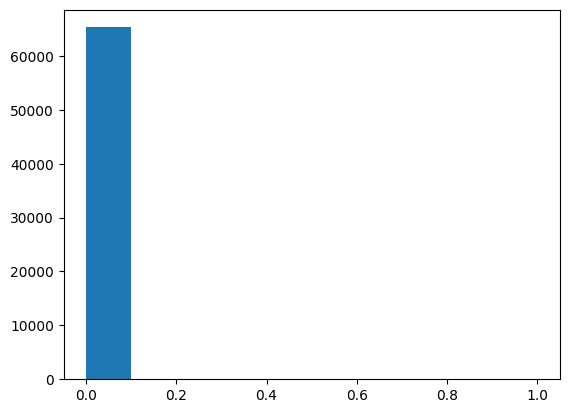

In [83]:
# plot hsitorgram of heatmap values
plt.hist(flat_heatmap)
plt.show()


In [90]:
np.sum(distances)

np.float64(6480339.375047037)

2.660334623054961
1013.0384852105108


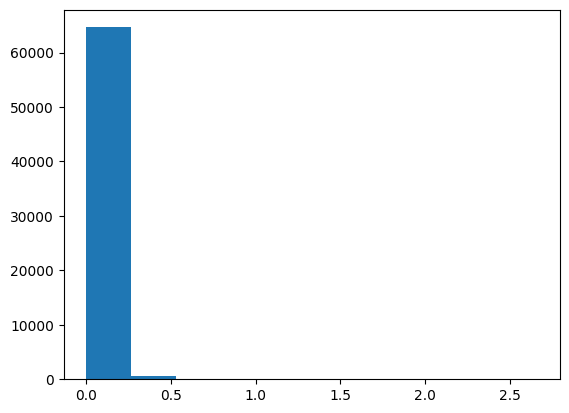

In [88]:
weighted_distance = distances * flat_heatmap
print(max(weighted_distance))
print(np.sum(weighted_distance))

plt.hist(weighted_distance)
plt.show()

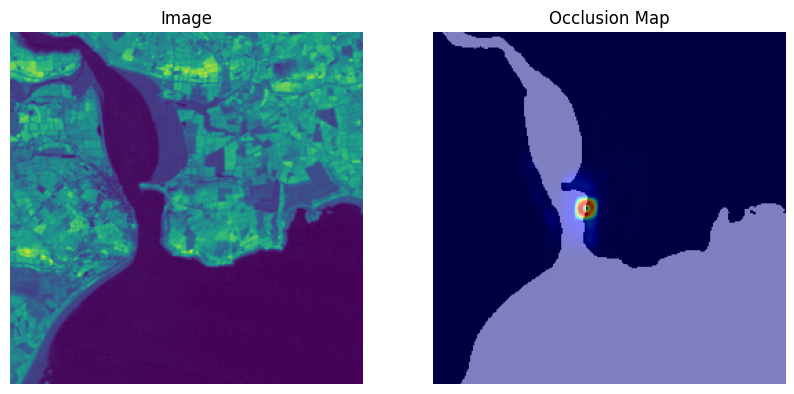

In [84]:

weighted_distance = np.reshape(weighted_distance, heatmap.shape)

overlay = occlusion_visualisation(mask, weighted_distance , alpha=0.5)
plot_occlusion_map(nir, overlay)

In [ ]:
pixels = [m for m in maps if 'pixel' in m]

rows = []
for path in pixels:
    name = path.split('/')[-1].split('_pixel')[0]

    path_format = path.replace("coastline_pixel","coastline") #mistake when saving the files
    path_format = path_format.replace(".npy","")
    path_split = path_format.split('_')
    x = path_split[-4]
    y = path_split[-3]

    patch_size = path_split[-2]
    stride = path_split[-1]

    pixel_type = path_split[-5]

    heatmap = np.load(path)
    weighted_context = calc_weighted_context((int(x), int(y)), heatmap)

    row = [path,name, int(x), int(y), int(patch_size), int(stride), pixel_type, weighted_context]

    
    
    rows.append(row)

df = pd.DataFrame(rows, columns=['path','name', 'x', 'y', 'patch_size', 'stride', 'pixel_type', 'weighted_context'])
df.head()



,path,name,x,y,patch_size,stride,pixel_type,weighted_context
0,../maps/LT05_L2SP_207024_19871024_20201014_02_...,LT05_L2SP_207024_19871024_20201014_02_T1,128,111,8,1,coastline,1013.038485
1,../maps/LT05_L2SP_207024_19871024_20201014_02_...,LT05_L2SP_207024_19871024_20201014_02_T1,166,136,8,1,coastline,775.429516
2,../maps/LT05_L2SP_207024_19871024_20201014_02_...,LT05_L2SP_207024_19871024_20201014_02_T1,247,210,8,1,water,563.741438
3,../maps/LT05_L2SP_207024_19871024_20201014_02_...,LT05_L2SP_207024_19871024_20201014_02_T1,237,72,8,1,water,570.998097
4,../maps/LT05_L2SP_207024_19871024_20201014_02_...,LT05_L2SP_207024_19871024_20201014_02_T1,10,56,8,1,land,1587.567428


coastline 920.71 222.73
water 611.31 176.91
land 3269.41 2517.83
fp 766.18 136.3
fn 952.09 110.25


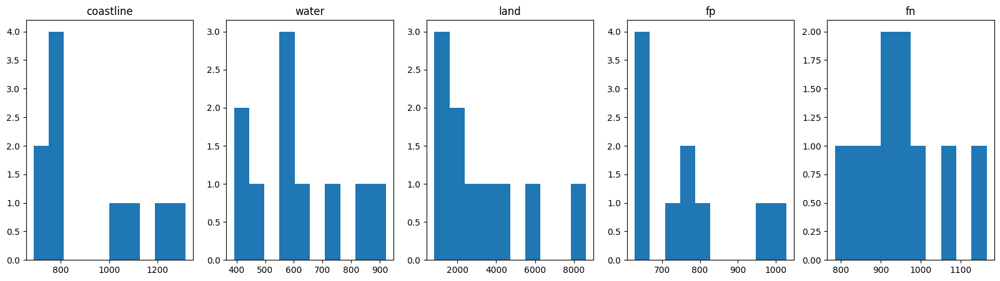

In [33]:
df['pixel_type'].unique()

fig, ax = plt.subplots(1, 5, figsize=(20, 5))

for i, pixel_type in enumerate(['coastline', 'water', 'land', 'fp', 'fn']):
    df_type = df[df['pixel_type'] == pixel_type]

    mean = df_type['weighted_context'].mean()
    mean = round(mean, 2)
    std = df_type['weighted_context'].std()
    std = round(std, 2)

    print(pixel_type, mean, std)

    ax[i].hist(df_type['weighted_context'])
    ax[i].set_title(pixel_type)

In [34]:
min_weighted_context = df['weighted_context'].min()
max_weighted_context = df['weighted_context'].max()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..391.05].


(182, 91)


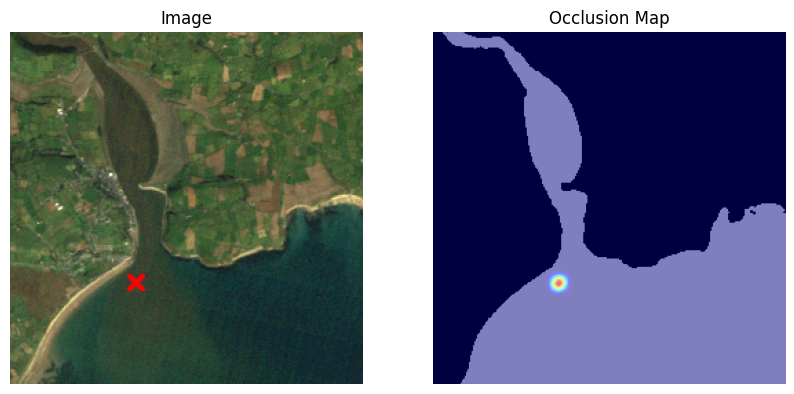

In [39]:
df_ = df[df['weighted_context'] == min_weighted_context]
name = df_['name'].values[0]
weighted_context = df_['weighted_context'].values[0]

path = f'../../data/LICS/test/{name}.npy'

x = df_['x'].values[0]
y = df_['y'].values[0]
pixel = (int(x), int(y))
print(pixel)


# Load data
data = np.load(path)
rgb = get_rgb(data,contrast=0.2)
mask = data[:,:,-2]
edge = data[:,:,-1]

heatmap = np.load(df_['path'].values[0])

overlay = occlusion_visualisation(mask, heatmap, alpha=0.5)
plot_occlusion_map(rgb, overlay, pixel,np.round(weighted_context,2))


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..8627.35].


(14, 72)


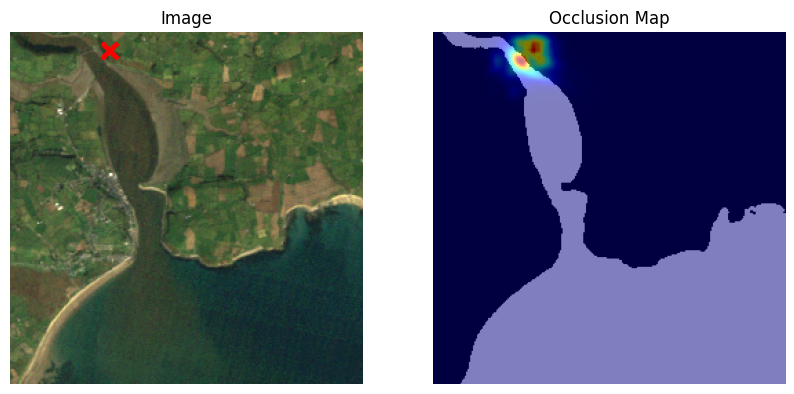

In [40]:
df_ = df[df['weighted_context'] == max_weighted_context]
name = df_['name'].values[0]
weighted_context = df_['weighted_context'].values[0]

path = f'../../data/LICS/test/{name}.npy'

x = df_['x'].values[0]
y = df_['y'].values[0]
pixel = (int(x), int(y))
print(pixel)


# Load data
data = np.load(path)
rgb = get_rgb(data,contrast=0.2)
mask = data[:,:,-2]
edge = data[:,:,-1]

heatmap = np.load(df_['path'].values[0])

overlay = occlusion_visualisation(mask, heatmap, alpha=0.5)
plot_occlusion_map(rgb, overlay, pixel,np.round(weighted_context,2))


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..391.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..426.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..446.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..564.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..571.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..579.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..627.0].
Clipping input data to the valid range for imshow with RGB dat

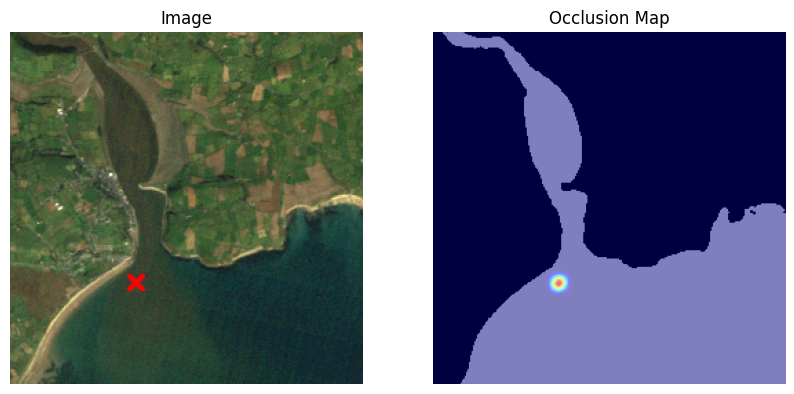

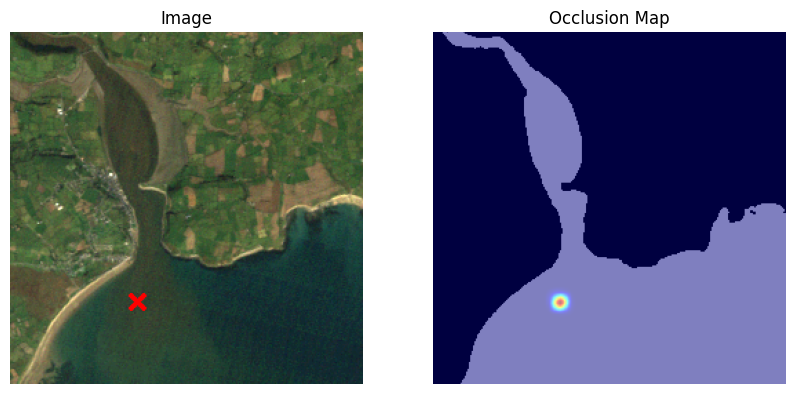

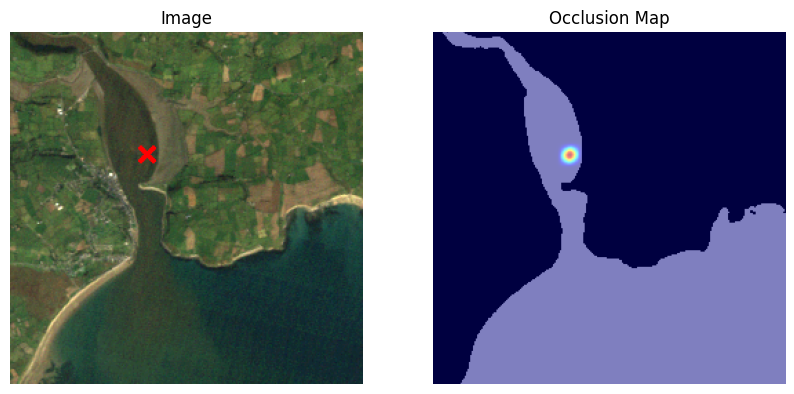

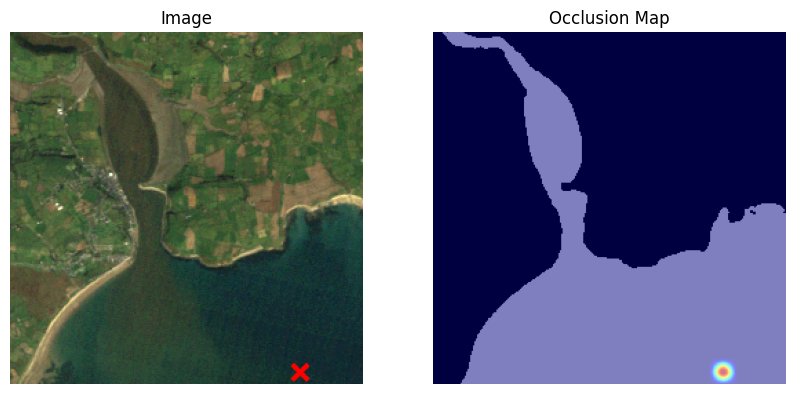

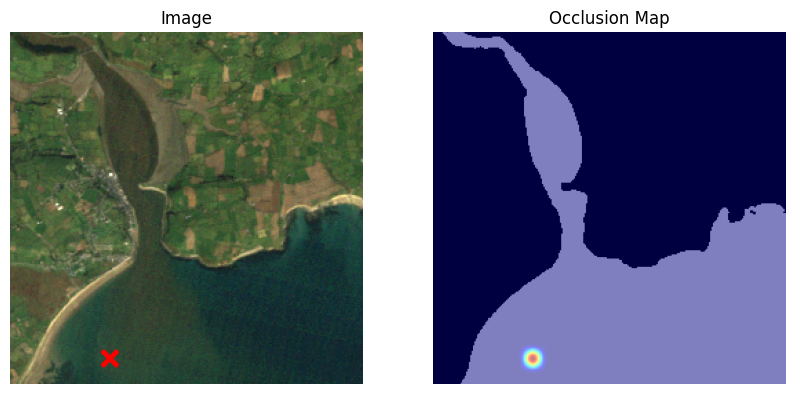

...

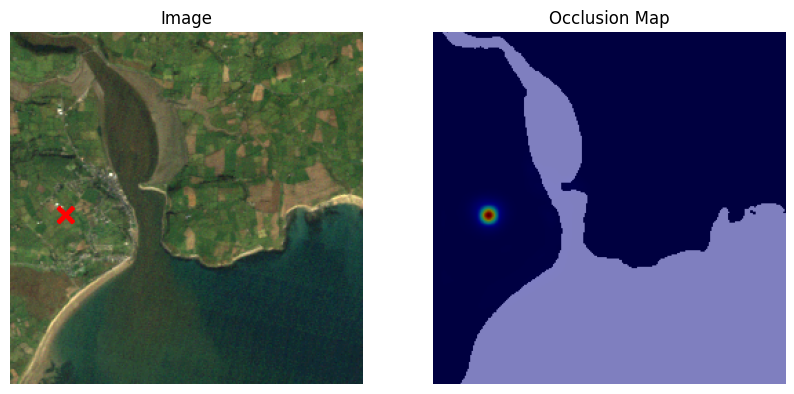

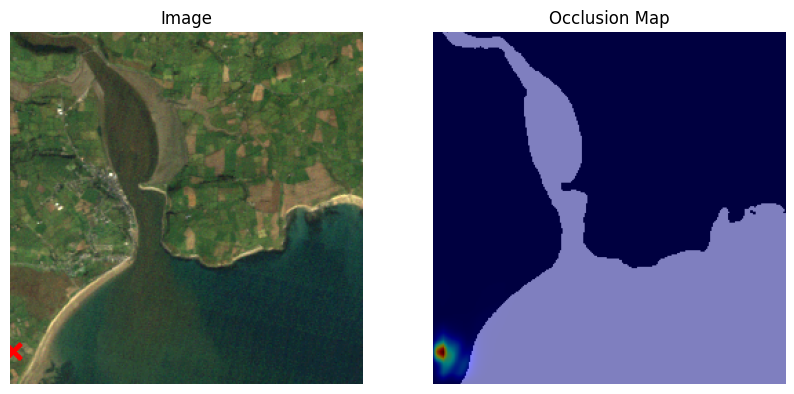

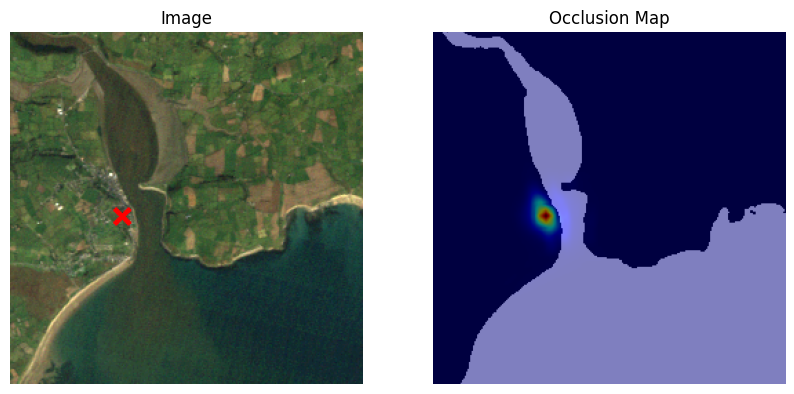

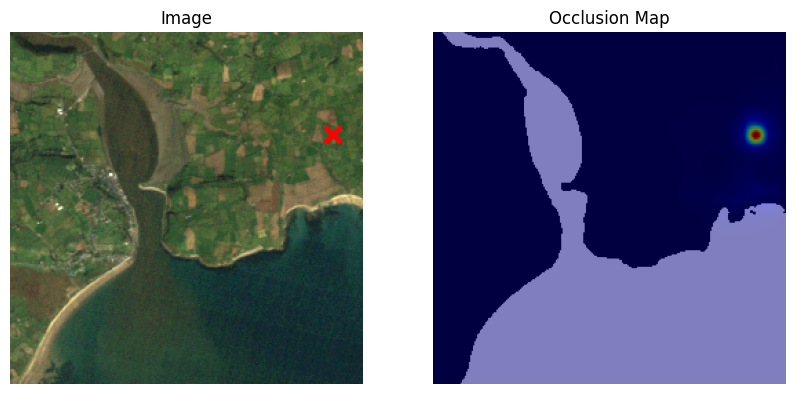

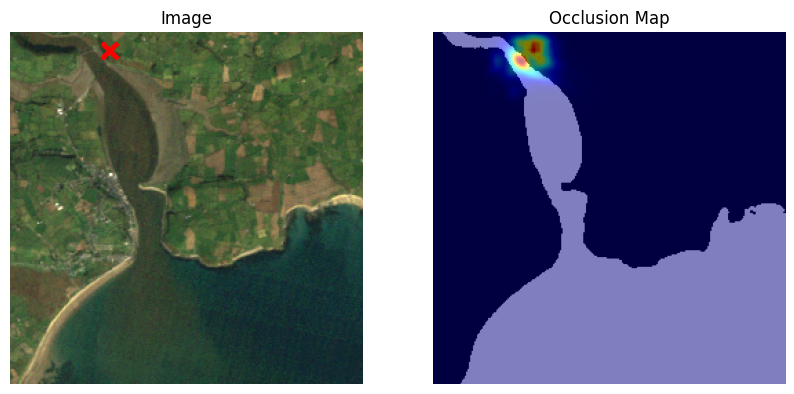

In [43]:
df_sorted = df.sort_values('weighted_context', ascending=True)
for row in df_sorted.iterrows():
    name = row[1]['name']
    weighted_context = row[1]['weighted_context']
    weighted_context = np.round(weighted_context)

    x = row[1]['x']
    y = row[1]['y']
    pixel = (int(x), int(y))


    path = f'../../data/LICS/test/{name}.npy'

    # Load data
    data = np.load(path)

    rgb = get_rgb(data,contrast=0.2)
    mask = data[:,:,-2]
    edge = data[:,:,-1]

    heatmap = np.load(row[1]['path'])

    overlay = occlusion_visualisation(mask, heatmap, alpha=0.5)
    plot_occlusion_map(rgb, overlay,pixel, weighted_context)
   